Setting the directory

In [1]:
import os
os.getcwd()
os.chdir('/Users/shankarasubramaniyang/Downloads/take-home-midterm/')

Importing the text file using pandas and displaying sample data

In [2]:
import pandas as pd
input_data = pd.read_table('t8.shakespeare.txt',names=['text'])
input_data.head(10)

,text
0,This is the 100th Etext file presented by Proj...
1,is presented in cooperation with World Library...
2,Library of the Future and Shakespeare CDROMS. ...
3,often releases Etexts that are NOT placed in t...
4,Shakespeare
5,*This Etext has certain copyright implications...
6,<<THIS ELECTRONIC VERSION OF THE COMPLETE WORK...
7,SHAKESPEARE IS COPYRIGHT 1990-1993 BY WORLD LI...
8,PROVIDED BY PROJECT GUTENBERG ETEXT OF ILLINOI...
9,WITH PERMISSION. ELECTRONIC AND MACHINE READA...


Removing the unwanted paragraphas from the text file

In [3]:
input_data[input_data['text'].str.contains('"Small Print" V.12.08.93', regex=False)]

,text
184,"[""Small Print"" V.12.08.93]"


In [4]:
input_data = input_data.drop(labels=range(0, 185), axis=0)
input_data.head(10)

,text
185,<<THIS ELECTRONIC VERSION OF THE COMPLETE WORK...
186,SHAKESPEARE IS COPYRIGHT 1990-1993 BY WORLD LI...
187,PROVIDED BY PROJECT GUTENBERG ETEXT OF ILLINOI...
188,WITH PERMISSION. ELECTRONIC AND MACHINE READA...
189,DISTRIBUTED SO LONG AS SUCH COPIES (1) ARE FOR...
190,"PERSONAL USE ONLY, AND (2) ARE NOT DISTRIBUTED..."
191,COMMERCIALLY. PROHIBITED COMMERCIAL DISTRIBUT...
192,SERVICE THAT CHARGES FOR DOWNLOAD TIME OR FOR ...
193,1609
194,THE SONNETS


In [5]:
input_data=input_data[~input_data.text.str.contains("<<THIS ELECTRONIC VERSION OF THE COMPLETE WORKS OF WILLIAM",regex=False)]
input_data=input_data[~input_data.text.str.contains("SHAKESPEARE IS COPYRIGHT 1990-1993 BY WORLD LIBRARY, INC., AND IS",regex=False)]
input_data=input_data[~input_data.text.str.contains("PROVIDED BY PROJECT GUTENBERG ETEXT OF ILLINOIS BENEDICTINE COLLEGE",regex=False)]
input_data=input_data[~input_data.text.str.contains("WITH PERMISSION.  ELECTRONIC AND MACHINE READABLE COPIES MAY BE",regex=False)]
input_data=input_data[~input_data.text.str.contains("DISTRIBUTED SO LONG AS SUCH COPIES (1) ARE FOR YOUR OR OTHERS",regex=False)]
input_data=input_data[~input_data.text.str.contains("PERSONAL USE ONLY, AND (2) ARE NOT DISTRIBUTED OR USED",regex=False)]
input_data=input_data[~input_data.text.str.contains("COMMERCIALLY.  PROHIBITED COMMERCIAL DISTRIBUTION INCLUDES BY ANY",regex=False)]
input_data=input_data[~input_data.text.str.contains("SERVICE THAT CHARGES FOR DOWNLOAD TIME OR FOR MEMBERSHIP.>>",regex=False)]
input_data

,text
193,1609
194,THE SONNETS
195,by William Shakespeare
196,1
197,"From fairest creatures we desire increase,"
...,...
114827,"O, all that borrowed motion, seeming owed,"
114828,"Would yet again betray the fore-betrayed,"
114829,And new pervert a reconciled maid.'
114830,THE END


In [6]:
input_data=input_data.reset_index(drop=True)
input_data

,text
0,1609
1,THE SONNETS
2,by William Shakespeare
3,1
4,"From fairest creatures we desire increase,"
...,...
112898,"O, all that borrowed motion, seeming owed,"
112899,"Would yet again betray the fore-betrayed,"
112900,And new pervert a reconciled maid.'
112901,THE END


Performing data transformation by converting the text into lowercase and displaying the sample data

In [7]:
input_data['text'] = input_data['text'].astype(str).str.lower()
input_data.head(10)

,text
0,1609
1,the sonnets
2,by william shakespeare
3,1
4,"from fairest creatures we desire increase,"
5,"that thereby beauty's rose might never die,"
6,"but as the riper should by time decease,"
7,his tender heir might bear his memory:
8,"but thou contracted to thine own bright eyes,"
9,feed'st thy light's flame with self-substant...


We are breaking the raw text into small chunks using tokenisation with Regexptokenize function

In [8]:
from nltk.tokenize import RegexpTokenizer

regexpfunc = RegexpTokenizer('\w+')

input_data['token']=input_data['text'].apply(regexpfunc.tokenize)
input_data.head(10)

,text,token
0,1609,[1609]
1,the sonnets,"[the, sonnets]"
2,by william shakespeare,"[by, william, shakespeare]"
3,1,[1]
4,"from fairest creatures we desire increase,","[from, fairest, creatures, we, desire, increase]"
5,"that thereby beauty's rose might never die,","[that, thereby, beauty, s, rose, might, never,..."
6,"but as the riper should by time decease,","[but, as, the, riper, should, by, time, decease]"
7,his tender heir might bear his memory:,"[his, tender, heir, might, bear, his, memory]"
8,"but thou contracted to thine own bright eyes,","[but, thou, contracted, to, thine, own, bright..."
9,feed'st thy light's flame with self-substant...,"[feed, st, thy, light, s, flame, with, self, s..."


Selecting the start and end lines from the textfile which contains sonnet&poem

In [9]:
input_data[input_data['text'].str.contains('from fairest creatures we desire increase', regex=False)]

,text,token
4,"from fairest creatures we desire increase,","[from, fairest, creatures, we, desire, increase]"


In [10]:
input_data[input_data['text'].str.contains("love's fire heats water, water cools not love", regex=False)]

,text,token
2311,"love's fire heats water, water cools not l...","[love, s, fire, heats, water, water, cools, no..."


Creating a dataframe for sonnet

In [11]:
sonnet= input_data.loc[4:2312]
sonnet

,text,token
4,"from fairest creatures we desire increase,","[from, fairest, creatures, we, desire, increase]"
5,"that thereby beauty's rose might never die,","[that, thereby, beauty, s, rose, might, never,..."
6,"but as the riper should by time decease,","[but, as, the, riper, should, by, time, decease]"
7,his tender heir might bear his memory:,"[his, tender, heir, might, bear, his, memory]"
8,"but thou contracted to thine own bright eyes,","[but, thou, contracted, to, thine, own, bright..."
...,...,...
2308,"growing a bath and healthful remedy,","[growing, a, bath, and, healthful, remedy]"
2309,"for men discased, but i my mistress' thrall,","[for, men, discased, but, i, my, mistress, thr..."
2310,came there for cure and this by that i pro...,"[came, there, for, cure, and, this, by, that, ..."
2311,"love's fire heats water, water cools not l...","[love, s, fire, heats, water, water, cools, no..."


In [12]:
input_data[input_data['text'].str.contains("a lover's complaint", regex=False)]

,text,token
112570,a lover's complaint,"[a, lover, s, complaint]"


In [13]:
poem= input_data.loc[112570:112901]
poem

,text,token
112570,a lover's complaint,"[a, lover, s, complaint]"
112571,by william shakespeare,"[by, william, shakespeare]"
112572,from off a hill whose concave womb reworded,"[from, off, a, hill, whose, concave, womb, rew..."
112573,"a plaintful story from a sist'ring vale,","[a, plaintful, story, from, a, sist, ring, vale]"
112574,"my spirits t'attend this double voice accorded,","[my, spirits, t, attend, this, double, voice, ..."
...,...,...
112897,"o, that sad breath his spongy lungs bestowed,","[o, that, sad, breath, his, spongy, lungs, bes..."
112898,"o, all that borrowed motion, seeming owed,","[o, all, that, borrowed, motion, seeming, owed]"
112899,"would yet again betray the fore-betrayed,","[would, yet, again, betray, the, fore, betrayed]"
112900,and new pervert a reconciled maid.',"[and, new, pervert, a, reconciled, maid]"


Since sonnet is also a poem we can combine sonent and poem data frame to a single df called poemfinal

In [14]:
poemsonnet= [sonnet,poem]
poemfinal=pd.concat(poemsonnet)
poemfinal=poemfinal.reset_index(drop=True)
poemfinal

,text,token
0,"from fairest creatures we desire increase,","[from, fairest, creatures, we, desire, increase]"
1,"that thereby beauty's rose might never die,","[that, thereby, beauty, s, rose, might, never,..."
2,"but as the riper should by time decease,","[but, as, the, riper, should, by, time, decease]"
3,his tender heir might bear his memory:,"[his, tender, heir, might, bear, his, memory]"
4,"but thou contracted to thine own bright eyes,","[but, thou, contracted, to, thine, own, bright..."
...,...,...
2636,"o, that sad breath his spongy lungs bestowed,","[o, that, sad, breath, his, spongy, lungs, bes..."
2637,"o, all that borrowed motion, seeming owed,","[o, all, that, borrowed, motion, seeming, owed]"
2638,"would yet again betray the fore-betrayed,","[would, yet, again, betray, the, fore, betrayed]"
2639,and new pervert a reconciled maid.',"[and, new, pervert, a, reconciled, maid]"


Creating a dataframe for dramas

In [15]:
dramas=input_data.loc[2314:112568]
dramas=dramas.reset_index(drop=True)
dramas

,text,token
0,alls well that ends well,"[alls, well, that, ends, well]"
1,by william shakespeare,"[by, william, shakespeare]"
2,dramatis personae,"[dramatis, personae]"
3,king of france,"[king, of, france]"
4,the duke of florence,"[the, duke, of, florence]"
...,...,...
110250,lead us from hence where we may leisurely,"[lead, us, from, hence, where, we, may, leisur..."
110251,each one demand and answer to his part,"[each, one, demand, and, answer, to, his, part]"
110252,perform'd in this wide gap of time since f...,"[perform, d, in, this, wide, gap, of, time, si..."
110253,we were dissever'd. hastily lead away. ...,"[we, were, dissever, d, hastily, lead, away, e..."


Importing the stopwords from text file and converting it into list form and printing the data

In [16]:
stopword=pd.read_table('stopwords.txt',names=['stopword'])
for i in stopword.keys():
    lists = list(stopword[i])
    print (lists)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', 'her', 'hers', 'herself', 'it', 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'will', 'just', 'don', 'should', 'no

Removing the stopwords from the poem and drama dataframes

In [17]:
import warnings
warnings.filterwarnings("ignore")
poemfinal['token'] = poemfinal['token'].apply(lambda x: [item for item in x if item not in lists])
poemfinal.head(10)

,text,token
0,"from fairest creatures we desire increase,","[fairest, creatures, desire, increase]"
1,"that thereby beauty's rose might never die,","[thereby, beauty, rose, might, never, die]"
2,"but as the riper should by time decease,","[riper, time, decease]"
3,his tender heir might bear his memory:,"[tender, heir, might, bear, memory]"
4,"but thou contracted to thine own bright eyes,","[thou, contracted, thine, bright, eyes]"
5,feed'st thy light's flame with self-substant...,"[feed, st, thy, light, flame, self, substantia..."
6,"making a famine where abundance lies,","[making, famine, abundance, lies]"
7,"thy self thy foe, to thy sweet self too cruel:","[thy, self, thy, foe, thy, sweet, self, cruel]"
8,"thou that art now the world's fresh ornament,","[thou, art, world, fresh, ornament]"
9,"and only herald to the gaudy spring,","[herald, gaudy, spring]"


In [18]:
dramas['token'] = dramas['token'].apply(lambda x: [item for item in x if item not in lists])
dramas.head(10)

,text,token
0,alls well that ends well,"[alls, well, ends, well]"
1,by william shakespeare,"[william, shakespeare]"
2,dramatis personae,"[dramatis, personae]"
3,king of france,"[king, france]"
4,the duke of florence,"[duke, florence]"
5,"bertram, count of rousillon","[bertram, count, rousillon]"
6,"lafeu, an old lord","[lafeu, old, lord]"
7,"parolles, a follower of bertram","[parolles, follower, bertram]"
8,"two french lords, serving with bertram","[two, french, lords, serving, bertram]"
9,"steward, servant to the countess of rousillon","[steward, servant, countess, rousillon]"


Cchanging the format of token column and removing infrequent words

In [19]:
poemfinal['token'] = poemfinal['token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
poemfinal.head(10)

,text,token
0,"from fairest creatures we desire increase,",fairest creatures desire increase
1,"that thereby beauty's rose might never die,",thereby beauty rose might never die
2,"but as the riper should by time decease,",riper time decease
3,his tender heir might bear his memory:,tender heir might bear memory
4,"but thou contracted to thine own bright eyes,",thou contracted thine bright eyes
5,feed'st thy light's flame with self-substant...,feed thy light flame self substantial fuel
6,"making a famine where abundance lies,",making famine abundance lies
7,"thy self thy foe, to thy sweet self too cruel:",thy self thy foe thy sweet self cruel
8,"thou that art now the world's fresh ornament,",thou art world fresh ornament
9,"and only herald to the gaudy spring,",herald gaudy spring


In [20]:
dramas['token'] = dramas['token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
dramas.head(10)

,text,token
0,alls well that ends well,alls well ends well
1,by william shakespeare,william shakespeare
2,dramatis personae,dramatis personae
3,king of france,king france
4,the duke of florence,duke florence
5,"bertram, count of rousillon",bertram count rousillon
6,"lafeu, an old lord",lafeu old lord
7,"parolles, a follower of bertram",parolles follower bertram
8,"two french lords, serving with bertram",two french lords serving bertram
9,"steward, servant to the countess of rousillon",steward servant countess rousillon


Importing nltk wordnet library 

In [21]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/shankarasubramaniyang/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

Lemmatisation of words where the ending of the words are removed to return the base word. It is used to analyse
the words morphologically.

In [22]:
from nltk.stem import WordNetLemmatizer

lemmi = WordNetLemmatizer()

poemfinal['token'] = poemfinal['token'].apply(lemmi.lemmatize)
poemfinal.head(10)

,text,token
0,"from fairest creatures we desire increase,",fairest creatures desire increase
1,"that thereby beauty's rose might never die,",thereby beauty rose might never die
2,"but as the riper should by time decease,",riper time decease
3,his tender heir might bear his memory:,tender heir might bear memory
4,"but thou contracted to thine own bright eyes,",thou contracted thine bright eyes
5,feed'st thy light's flame with self-substant...,feed thy light flame self substantial fuel
6,"making a famine where abundance lies,",making famine abundance lies
7,"thy self thy foe, to thy sweet self too cruel:",thy self thy foe thy sweet self cruel
8,"thou that art now the world's fresh ornament,",thou art world fresh ornament
9,"and only herald to the gaudy spring,",herald gaudy spring


In [23]:
dramas['token'] = dramas['token'].apply(lemmi.lemmatize)
dramas.head(10)

,text,token
0,alls well that ends well,alls well ends well
1,by william shakespeare,william shakespeare
2,dramatis personae,dramatis personae
3,king of france,king france
4,the duke of florence,duke florence
5,"bertram, count of rousillon",bertram count rousillon
6,"lafeu, an old lord",lafeu old lord
7,"parolles, a follower of bertram",parolles follower bertram
8,"two french lords, serving with bertram",two french lords serving bertram
9,"steward, servant to the countess of rousillon",steward servant countess rousillon


I have created a variable called combine words to form a paragraph out of the token column.

In [24]:
poemcombinewords = ' '.join([word for word in poemfinal['token']])
poemcombinewords

'fairest creatures desire increase thereby beauty rose might never die riper time decease tender heir might bear memory thou contracted thine bright eyes feed thy light flame self substantial fuel making famine abundance lies thy self thy foe thy sweet self cruel thou art world fresh ornament herald gaudy spring within thine bud buriest thy content tender churl mak waste niggarding pity world else glutton eat world due grave thee  forty winters shall besiege thy brow dig deep trenches thy beauty field thy youth proud livery gazed tattered weed small worth held asked thy beauty lies treasure thy lusty days say within thine deep sunken eyes eating shame thriftless praise much praise deserved thy beauty use thou couldst answer fair child mine shall sum count make old excuse proving beauty succession thine new made thou art old see thy blood warm thou feel cold  look thy glass tell face thou viewest time face form another whose fresh repair thou renewest thou dost beguile world unbless mot

In [25]:
dramacombinewords = ' '.join([word for word in dramas['token']])
dramacombinewords

'alls well ends well william shakespeare dramatis personae king france duke florence bertram count rousillon lafeu old lord parolles follower bertram two french lords serving bertram steward servant countess rousillon lavache clown servant countess rousillon page servant countess rousillon countess rousillon mother bertram helena gentlewoman protected countess widow florence diana daughter widow violenta neighbour friend widow mariana neighbour friend widow lords officers soldiers etc french florentine scene rousillon paris florence marseilles act scene rousillon count palace enter bertram countess rousillon helena lafeu black countess delivering son bury second husband bertram going madam weep father death anew must attend majesty command ward evermore subjection lafeu shall find king husband madam sir father generally times good must necessity hold virtue whose worthiness would stir wanted rather lack abundance countess hope majesty amendment lafeu hath abandon physicians madam whose

Combining both poem and drama words together

In [26]:
combinewords=" ".join([poemcombinewords, dramacombinewords])
combinewords

'fairest creatures desire increase thereby beauty rose might never die riper time decease tender heir might bear memory thou contracted thine bright eyes feed thy light flame self substantial fuel making famine abundance lies thy self thy foe thy sweet self cruel thou art world fresh ornament herald gaudy spring within thine bud buriest thy content tender churl mak waste niggarding pity world else glutton eat world due grave thee  forty winters shall besiege thy brow dig deep trenches thy beauty field thy youth proud livery gazed tattered weed small worth held asked thy beauty lies treasure thy lusty days say within thine deep sunken eyes eating shame thriftless praise much praise deserved thy beauty use thou couldst answer fair child mine shall sum count make old excuse proving beauty succession thine new made thou art old see thy blood warm thou feel cold  look thy glass tell face thou viewest time face form another whose fresh repair thou renewest thou dost beguile world unbless mot

Importing libraries like wordcloud, image and creating a function to define the wordcloud and plotting the words. Also I have added background color, color map and sturctured the wordcloud 

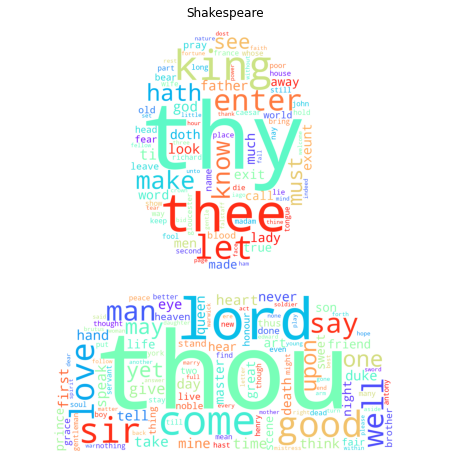

In [27]:
#conda install -c conda-forge wordcloud
from wordcloud import WordCloud, ImageColorGenerator
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
shakes = np.array(Image.open('shakes.jpg'))
def generate_wordcloud(data,title, mask=None):
    cloud = WordCloud(width = 4000, height = 2000, random_state=1,
                      colormap='rainbow',
                      mask=mask,
                      background_color='white',
                      collocations=False).generate_from_text(data)
    plt.figure(figsize=(10,8))
    plt.imshow(cloud)
    plt.axis('off')
    plt.title(title)
    plt.show()
    
# Use the function with the rome_corpus and our mask to create word cloud     
generate_wordcloud(combinewords, 'Shakespeare', mask=shakes)

What's the average number of words per sentence (note: for poems, consider each line to be a separate sentence)? 

Calculating the total number of words , total number of lines and the average word count

In [28]:
word_count=len(combinewords.split())
print("Total number of words in the text :", word_count)

line_count= len(poemfinal.index)+len(dramas.index)
print("Total number of line in the text :", line_count)

average_words=word_count/line_count
print("Average words count :", round(average_words,2))

Total number of words in the text : 461184
Total number of line in the text : 112896
Average words count : 4.09


What's the average number of words per sentence per type of publication (drama, comedy, history, poem)?

# POEM

In [29]:
poem_word_count=len(poemcombinewords.split())
print("Total number of words in the poem :", poem_word_count)

poem_line_count= len(poemfinal.index)
print("Total number of line in the poem :", poem_line_count)

poem_average_words=poem_word_count/poem_line_count
print("Average words count in the poem :", round(poem_average_words,2))

Total number of words in the poem : 11065
Total number of line in the poem : 2641
Average words count in the poem : 4.19


# DRAMA

In [30]:
drama_word_count=len(dramacombinewords.split())
print("Total number of words in the drama :", drama_word_count)

drama_line_count= len(dramas.index)
print("Total number of line in the drama :", drama_line_count)

drama_average_words=drama_word_count/drama_line_count
print("Average words count in the drama :", round(drama_average_words,2))

Total number of words in the drama : 450119
Total number of line in the drama : 110255
Average words count in the drama : 4.08


# HISTORY

Extracting the history portion from the dramas dataframe and repeating the same steps as above. There
are in total 9 dramas with genre history. I am creating two data frames to extract the data and combine it into a single df called historyfinal. Selecting data from THE FIRST PART OF KING HENRY THE FOURTH until KING JOHN and keeping it under hist1 df

In [31]:
dramas[dramas['text'].str.contains("the first part of king henry the fourth", regex=False)]

,text,token
23327,the first part of king henry the fourth,first part king henry fourth


In [32]:
dramas[dramas['text'].str.contains("to part the glories of this happy day", regex=False)]

,text,token
51598,to part the glories of this happy day. ...,part glories happy day exeunt


In [33]:
hist1=dramas.loc[23327:51599]
hist1

,text,token
23327,the first part of king henry the fourth,first part king henry fourth
23328,by william shakespeare,william shakespeare
23329,dramatis personae,dramatis personae
23330,king henry the fourth.,king henry fourth
23331,"henry, prince of wales, son to the king.",henry prince wales son king
...,...,...
51595,"within my tent his bones tonight shall lie,",within tent bones tonight shall lie
51596,"most like a soldier, ordered honorably.",like soldier ordered honorably
51597,"so call the field to rest, and let's away,",call field rest let away
51598,to part the glories of this happy day. ...,part glories happy day exeunt


Selecting KING RICHARD THE SECOND and KING RICHARD III and keeping it under hist2 df

In [34]:
dramas[dramas['text'].str.contains("king richard the second", regex=False)]

,text,token
77453,king richard the second,king richard second
77456,king richard the second,king richard second


In [35]:
dramas[dramas['text'].str.contains("that she may long live here, god say amen!", regex=False)]

,text,token
84585,"that she may long live here, god say amen!...",may long live god say amen exeunt


In [36]:
hist2=dramas.loc[77453:84586]
hist2

,text,token
77453,king richard the second,king richard second
77454,by william shakespeare,william shakespeare
77455,dramatis personae,dramatis personae
77456,king richard the second,king richard second
77457,"john of gaunt, duke of lancaster - uncle to ...",john gaunt duke lancaster uncle king
...,...,...
84582,let them not live to taste this land's inc...,let live taste land increase
84583,that would with treason wound this fair la...,would treason wound fair land peace
84584,"now civil wounds are stopp'd, peace lives ...",civil wounds stopp peace lives
84585,"that she may long live here, god say amen!...",may long live god say amen exeunt


In [37]:
historycomb= [hist1,hist2]
historyfinal=pd.concat(historycomb)
historyfinal=historyfinal.reset_index(drop=True)
historyfinal

,text,token
0,the first part of king henry the fourth,first part king henry fourth
1,by william shakespeare,william shakespeare
2,dramatis personae,dramatis personae
3,king henry the fourth.,king henry fourth
4,"henry, prince of wales, son to the king.",henry prince wales son king
...,...,...
35402,let them not live to taste this land's inc...,let live taste land increase
35403,that would with treason wound this fair la...,would treason wound fair land peace
35404,"now civil wounds are stopp'd, peace lives ...",civil wounds stopp peace lives
35405,"that she may long live here, god say amen!...",may long live god say amen exeunt


In [38]:
historycombinewords = ' '.join([word for word in historyfinal['token']])
historycombinewords

'first part king henry fourth william shakespeare dramatis personae king henry fourth henry prince wales son king prince john lancaster son king earl westmoreland sir walter blunt thomas percy earl worcester henry percy earl northumberland henry percy surnamed hotspur son edmund mortimer earl march richard scroop archbishop york archibald earl douglas owen glendower sir richard vernon sir john falstaff sir michael friend archbishop york poins gadshill peto bardolph lady percy wife hotspur sister mortimer lady mortimer daughter glendower wife mortimer mistress quickly hostess boar head eastcheap lords officers sheriff vintner chamberlain drawers two carriers travellers attendants scene england wales act scene london palace enter king lord john lancaster earl westmoreland sir walter blunt others king shaken wan care find time frighted peace pant breathe short winded accents new broils commenc stronds afar remote thirsty entrance soil shall daub lips children blood shall trenching war cha

In [39]:
history_word_count=len(historycombinewords.split())
print("Total number of words in the history :", history_word_count)

history_line_count= len(historyfinal.index)
print("Total number of line in the history :", history_line_count)

history_average_words=history_word_count/history_line_count
print("Average words count in the history :", round(history_average_words,2))

Total number of words in the history : 148903
Total number of line in the history : 35407
Average words count in the history : 4.21


# COMEDY

Extracting the comedy portion from the dramas dataframe and repeating the same steps as above. There are in total 14 dramas with genre comedy. 
Selecting data from ALLS WELL THAT ENDS WELL! and keeping it in com1

In [40]:
dramas[dramas['text'].str.contains("alls well that ends well", regex=False)]

,text,token
0,alls well that ends well,alls well ends well


In [41]:
dramas[dramas['text'].str.contains("your gentle hands lend us, and take our hearts.", regex=False)]

,text,token
2952,"your gentle hands lend us, and take our he...",gentle hands lend take hearts


In [42]:
com1=dramas.loc[0:2952]
com1

,text,token
0,alls well that ends well,alls well ends well
1,by william shakespeare,william shakespeare
2,dramatis personae,dramatis personae
3,king of france,king france
4,the duke of florence,duke florence
...,...,...
2948,"all is well ended if this suit be won,",well ended suit won
2949,that you express content; which we will pay,express content pay
2950,"with strife to please you, day exceeding day.",strife please day exceeding day
2951,"ours be your patience then, and yours our ...",patience parts


Selecting data from AS YOU LIKE IT and THE COMEDY OF ERRORS and storing it in com2

In [43]:
dramas[dramas['text'].str.contains("as you like it", regex=False)]

,text,token
6800,as you like it,like


In [44]:
dramas[dramas['text'].str.contains("and now let's go hand in hand, not one before another.", regex=False)]

,text,token
11407,"and now let's go hand in hand, not one befor...",let hand hand one another


In [45]:
com2=dramas.loc[6800:11407]
com2

,text,token
6800,as you like it,like
6801,by william shakespeare,william shakespeare
6802,dramatis personae.,dramatis personae
6803,"duke, living in exile",duke living exile
6804,"frederick, his brother, and usurper of his d...",frederick brother usurper dominions
...,...,...
11403,dromio of syracuse. we'll draw cuts for the se...,dromio syracuse draw cuts senior till
11404,lead thou first.,lead thou first
11405,"dromio of ephesus. nay, then, thus:",dromio ephesus nay thus
11406,we came into the world like brother and brot...,came world like brother brother


Selecting data from LOVE'S LABOUR'S LOST and storing it in com3

In [46]:
dramas[dramas['text'].str.contains("love's labour's lost", regex=False)]

,text,token
55233,love's labour's lost,love labour lost


In [47]:
dramas[dramas['text'].str.contains("you that way: we this way.", regex=False)]

,text,token
58059,you that way: we this way. ...,way way exeunt


In [48]:
com3=dramas.loc[55233:58059]
com3

,text,token
55233,love's labour's lost,love labour lost
55234,by william shakespeare,william shakespeare
55235,dramatis personae.,dramatis personae
55236,"ferdinand, king of navarre",ferdinand king navarre
55237,"berowne, lord attending on the king",berowne lord attending king
...,...,...
58055,'tu-who;,
58056,"tu-whit, to-who'- a merry note,",whit merry note
58057,while greasy joan doth keel the pot.,greasy joan doth keel pot
58058,armado. the words of mercury are harsh after...,armado words mercury harsh songs apollo


Selecting data from MEASURE FOR MEASURE till MUCH ADO ABOUT NOTHING and storing it in com4

In [49]:
dramas[dramas['text'].str.contains("measure for measure", regex=False)]

,text,token
40727,measure for measure must be answered.,measure measure must answered
60631,measure for measure,measure measure


In [50]:
dramas[dramas['text'].str.contains("punishments for him. strike up, pipers!", regex=False)]

,text,token
73818,"punishments for him. strike up, pipers!",punishments strike pipers


In [51]:
com4=dramas.loc[60631:73818]
com4

,text,token
60631,measure for measure,measure measure
60632,by william shakespeare,william shakespeare
60633,dramatis personae,dramatis personae
60634,"vincentio, the duke",vincentio duke
60635,"angelo, the deputy",angelo deputy
...,...,...
73814,enter messenger.,enter messenger
73815,"mess. my lord, your brother john is ta'en in...",mess lord brother john flight
73816,and brought with armed men back to messina.,brought armed men back messina
73817,bene. think not on him till to-morrow. i'll ...,bene think till morrow devise thee brave


Selecting data from THE TAMING OF THE SHREW till THE TEMPEST and storing it in com5

In [52]:
dramas[dramas['text'].str.contains("the taming of the shrew", regex=False)]

,text,token
87871,the taming of the shrew,taming shrew


In [53]:
dramas[dramas['text'].str.contains("let your indulgence set me free.", regex=False)]

,text,token
93079,let your indulgence set me free.,let indulgence set free


In [54]:
com5=dramas.loc[87871:93079]
com5

,text,token
87871,the taming of the shrew,taming shrew
87872,by william shakespeare,william shakespeare
87873,dramatis personae,dramatis personae
87874,persons in the induction,persons induction
87875,a lord,lord
...,...,...
93075,"unless i be reliev'd by prayer,",unless reliev prayer
93076,which pierces so that it assaults,pierces assaults
93077,"mercy itself, and frees all faults.",mercy frees faults
93078,"as you from crimes would pardon'd be,",crimes would pardon


Selecting data from THE HISTORY OF TROILUS AND CRESSIDA till THE TWO GENTLEMEN OF VERONA and storing it in com6

In [55]:
dramas[dramas['text'].str.contains("the history of troilus and cressida", regex=False)]

,text,token
98422,the history of troilus and cressida,history troilus cressida


In [56]:
dramas[dramas['text'].str.contains("one feast, one house, one mutual happiness!", regex=False)]

,text,token
106884,"one feast, one house, one mutual happiness...",one feast one house one mutual happiness exeunt


In [57]:
com6=dramas.loc[98422:106884]
com6

,text,token
98422,the history of troilus and cressida,history troilus cressida
98423,by william shakespeare,william shakespeare
98424,dramatis personae,dramatis personae
98425,"priam, king of troy",priam king troy
98426,his sons:,son
...,...,...
106880,that you will wonder what hath fortuned.,wonder hath fortuned
106881,"come, proteus, 'tis your penance but to hear",come proteus tis penance hear
106882,the story of your loves discovered.,story loves discovered
106883,"that done, our day of marriage shall be yo...",done day marriage shall


In [58]:
comedycomb= [com1,com2,com3,com4,com5,com6]
comedyfinal=pd.concat(comedycomb)
comedyfinal=comedyfinal.reset_index(drop=True)
comedyfinal

,text,token
0,alls well that ends well,alls well ends well
1,by william shakespeare,william shakespeare
2,dramatis personae,dramatis personae
3,king of france,king france
4,the duke of florence,duke florence
...,...,...
37243,that you will wonder what hath fortuned.,wonder hath fortuned
37244,"come, proteus, 'tis your penance but to hear",come proteus tis penance hear
37245,the story of your loves discovered.,story loves discovered
37246,"that done, our day of marriage shall be yo...",done day marriage shall


In [59]:
comedycombinewords = ' '.join([word for word in comedyfinal['token']])
comedycombinewords

'alls well ends well william shakespeare dramatis personae king france duke florence bertram count rousillon lafeu old lord parolles follower bertram two french lords serving bertram steward servant countess rousillon lavache clown servant countess rousillon page servant countess rousillon countess rousillon mother bertram helena gentlewoman protected countess widow florence diana daughter widow violenta neighbour friend widow mariana neighbour friend widow lords officers soldiers etc french florentine scene rousillon paris florence marseilles act scene rousillon count palace enter bertram countess rousillon helena lafeu black countess delivering son bury second husband bertram going madam weep father death anew must attend majesty command ward evermore subjection lafeu shall find king husband madam sir father generally times good must necessity hold virtue whose worthiness would stir wanted rather lack abundance countess hope majesty amendment lafeu hath abandon physicians madam whose

In [60]:
comedy_word_count=len(comedycombinewords.split())
print("Total number of words in the comedy :", comedy_word_count)

comedy_line_count= len(comedyfinal.index)
print("Total number of line in the comedy :", comedy_line_count)

comedy_average_words=comedy_word_count/comedy_line_count
print("Average words count in the comedy :", round(comedy_average_words,2))

Total number of words in the comedy : 153965
Total number of line in the comedy : 37248
Average words count in the comedy : 4.13


Importing the freqdist and tokenize libraries to plot the most common words that occurs in the text.
punkt is a data model created by Jan Strunk that NLTK uses to split full texts into word lists

In [61]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/shankarasubramaniyang/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

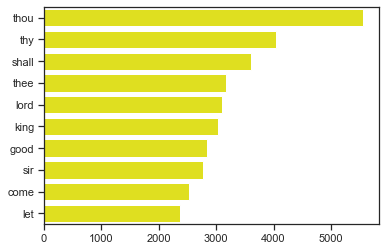

In [62]:
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist

mostcommon = nltk.word_tokenize(combinewords)
frequencydist = FreqDist(mostcommon)

topten = frequencydist.most_common(10)
frequencydistseries = pd.Series(dict(topten))

import seaborn as sns
sns.set_theme(style="ticks")

sns.barplot(y=frequencydistseries.index, x=frequencydistseries.values, color='yellow');

# TRAGEDY

Selecting data from THE TRAGEDY OF ANTONY AND CLEOPATRA! and storing it in trag1

In [63]:
dramas[dramas['text'].str.contains("the tragedy of antony and cleopatra", regex=False)]

,text,token
2956,the tragedy of antony and cleopatra,tragedy antony cleopatra


In [64]:
dramas[dramas['text'].str.contains("high order in this great solemnity.", regex=False)]

,text,token
6797,high order in this great solemnity. ...,high order great solemnity exeunt


In [65]:
trag1=dramas.loc[2956:6797]
trag1

,text,token
2956,the tragedy of antony and cleopatra,tragedy antony cleopatra
2957,by william shakespeare,william shakespeare
2958,dramatis personae,dramatis personae
2959,"mark antony, triumvirs",mark antony triumvirs
2960,"octavius caesar, """,octavius caesar
...,...,...
6793,no less in pity than his glory which,less pity glory
6794,brought them to be lamented. our army shall,brought lamented army shall
6795,"in solemn show attend this funeral,",solemn show attend funeral
6796,"and then to rome. come, dolabella, see",rome come dolabella see


Selecting data from THE TRAGEDY OF CORIOLANUS till THE TRAGEDY OF HAMLET, PRINCE OF DENMARK and storing it in trag2

In [66]:
dramas[dramas['text'].str.contains("the tragedy of coriolanus", regex=False)]

,text,token
11411,the tragedy of coriolanus,tragedy coriolanus


In [67]:
dramas[dramas['text'].str.contains("are shot off.", regex=False)]

,text,token
23324,...,shot


In [68]:
trag2=dramas.loc[11411:23324]
trag2

,text,token
11411,the tragedy of coriolanus,tragedy coriolanus
11412,by william shakespeare,william shakespeare
11413,dramatis personae,dramatis personae
11414,"caius marcius, afterwards caius marcius cori...",caius marcius afterwards caius marcius coriolanus
11415,generals against the volscians,generals volscians
...,...,...
23320,take up the bodies. such a sight as this,take bodies sight
23321,becomes the field but here shows much amiss.,becomes field shows much amiss
23322,"go, bid the soldiers shoot.",bid soldiers shoot
23323,exeunt marching; after the which a...,exeunt marching peal ordnance


Selecting data from THE TRAGEDY OF KING LEAR and storing it in trag3

In [69]:
dramas[dramas['text'].str.contains("the tragedy of king lear", regex=False)]

,text,token
51601,the tragedy of king lear,tragedy king lear


In [70]:
dramas[dramas['text'].str.contains("exeunt with a dead march.", regex=False)]

,text,token
55230,exeunt ...,exeunt dead march


In [71]:
trag3=dramas.loc[51601:55230]
trag3

,text,token
51601,the tragedy of king lear,tragedy king lear
51602,by william shakespeare,william shakespeare
51603,dramatis personae,dramatis personae
51604,"lear, king of britain.",lear king britain
51605,king of france.,king france
...,...,...
55226,"alb. the weight of this sad time we must obey,",alb weight sad time must obey
55227,"speak what we feel, not what we ought to ...",speak feel ought say
55228,the oldest have borne most; we that are y...,oldest borne young
55229,"shall never see so much, nor live so long.",shall never see much live long


Selecting data from THE TRAGEDY OF MACBETH and storing it in trag4

In [72]:
dramas[dramas['text'].str.contains("the tragedy of macbeth", regex=False)]

,text,token
58062,the tragedy of macbeth,tragedy macbeth


In [73]:
dramas[dramas['text'].str.contains("whom we invite to see us crown'd at scone.", regex=False)]

,text,token
60627,whom we invite to see us crown'd at scone.,invite see crown scone


In [74]:
trag4=dramas.loc[58062:60628]
trag4

,text,token
58062,the tragedy of macbeth,tragedy macbeth
58063,by william shakespeare,william shakespeare
58064,dramatis personae,dramatis personae
58065,"duncan, king of scotland",duncan king scotland
58066,"macbeth, thane of glamis and cawdor, a gener...",macbeth thane glamis cawdor general king army
...,...,...
60624,"that calls upon us, by the grace of grace",calls upon grace grace
60625,"we will perform in measure, time, and place.",perform measure time place
60626,"so thanks to all at once and to each one,",thanks one
60627,whom we invite to see us crown'd at scone.,invite see crown scone


Selecting data from THE TRAGEDY OF OTHELLO, MOOR OF VENICE and storing it in trag5 

In [75]:
dramas[dramas['text'].str.contains("the tragedy of othello, moor of venice", regex=False)]

,text,token
73822,"the tragedy of othello, moor of venice",tragedy othello moor venice


In [76]:
dramas[dramas['text'].str.contains("this heavy act with heavy heart relate.", regex=False)]

,text,token
77450,this heavy act with heavy heart relate. ...,heavy act heavy heart relate exeunt


In [77]:
trag5=dramas.loc[73822:77450]
trag5

,text,token
73822,"the tragedy of othello, moor of venice",tragedy othello moor venice
73823,by william shakespeare,william shakespeare
73824,dramatis personae,dramatis personae
73825,"othello, the moor, general of the venetian f...",othello moor general venetian forces
73826,"desdemona, his wife",desdemona wife
...,...,...
77446,"for they succeed on you. to you, lord gove...",succeed lord governor
77447,"remains the censure of this hellish villain,",remains censure hellish villain
77448,"the time, the place, the torture. o, enfor...",time place torture enforce
77449,"myself will straight aboard, and to the state",straight aboard state


Selecting data from THE TRAGEDY OF ROMEO AND JULIET and storing it in trag6 

In [78]:
dramas[dramas['text'].str.contains("the tragedy of romeo and juliet", regex=False)]

,text,token
84588,the tragedy of romeo and juliet,tragedy romeo juliet


In [79]:
dramas[dramas['text'].str.contains("than this of juliet and her romeo.", regex=False)]

,text,token
87867,than this of juliet and her romeo.,juliet romeo


In [80]:
trag6=dramas.loc[84588:87867]
trag6

,text,token
84588,the tragedy of romeo and juliet,tragedy romeo juliet
84589,by william shakespeare,william shakespeare
84590,dramatis personae,dramatis personae
84591,chorus.,chorus
84592,"escalus, prince of verona.",escalus prince verona
...,...,...
87863,the sun for sorrow will not show his head.,sun sorrow show head
87864,"go hence, to have more talk of these sad t...",hence talk sad things
87865,"some shall be pardon'd, and some punished;",shall pardon punished
87866,for never was a story of more woe,never story woe


Selecting data from THE LIFE OF TIMON OF ATHENS,THE TRAGEDY OF TITUS ANDRONICUS and storing it in trag7

In [81]:
dramas[dramas['text'].str.contains("the life of timon of athens", regex=False)]

,text,token
93082,the life of timon of athens,life timon athens


In [82]:
 dramas[dramas['text'].str.contains("and being dead, let birds on her take pity.", regex=False)]

,text,token
98419,"and being dead, let birds on her take pity...",dead let birds take pity exeunt


In [83]:
trag7=dramas.loc[93082:98419]
trag7

,text,token
93082,the life of timon of athens,life timon athens
93083,by william shakespeare,william shakespeare
93084,dramatis personae,dramatis personae
93085,timon of athens,timon athens
93086,lucius,lucius
...,...,...
98415,"no funeral rite, nor man in mourning weed,",funeral rite man mourning weed
98416,no mournful bell shall ring her burial;,mournful bell shall ring burial
98417,but throw her forth to beasts and birds to...,throw forth beasts birds prey
98418,"her life was beastly and devoid of pity,",life beastly devoid pity


Selecting data from THE WINTER'S TALE and storing it in trag8

In [84]:
dramas[dramas['text'].str.contains("the winter's tale", regex=False)]

,text,token
106887,the winter's tale,winter tale


In [85]:
dramas[dramas['text'].str.contains("we were dissever'd. hastily lead away.", regex=False)]

,text,token
110253,we were dissever'd. hastily lead away. ...,dissever hastily lead away exeunt


In [86]:
trag8=dramas.loc[106887:110253]
trag8

,text,token
106887,the winter's tale,winter tale
106888,by william shakespeare,william shakespeare
106889,dramatis personae,dramatis personae
106890,"leontes, king of sicilia",leontes king sicilia
106891,"mamillius, his son, the young prince of sicilia",mamillius son young prince sicilia
...,...,...
110249,is troth-plight to your daughter. good pau...,troth plight daughter good paulina
110250,lead us from hence where we may leisurely,lead hence may leisurely
110251,each one demand and answer to his part,one demand answer part
110252,perform'd in this wide gap of time since f...,perform wide gap time since first


In [87]:
tragedycomb= [trag1,trag2,trag3,trag4,trag4,trag5,trag6,trag7,trag8]
tragedyfinal=pd.concat(tragedycomb)
tragedyfinal=tragedyfinal.reset_index(drop=True)
tragedyfinal

,text,token
0,the tragedy of antony and cleopatra,tragedy antony cleopatra
1,by william shakespeare,william shakespeare
2,dramatis personae,dramatis personae
3,"mark antony, triumvirs",mark antony triumvirs
4,"octavius caesar, """,octavius caesar
...,...,...
40129,is troth-plight to your daughter. good pau...,troth plight daughter good paulina
40130,lead us from hence where we may leisurely,lead hence may leisurely
40131,each one demand and answer to his part,one demand answer part
40132,perform'd in this wide gap of time since f...,perform wide gap time since first


In [88]:
tragedycombinewords = ' '.join([word for word in tragedyfinal['token']])
tragedycombinewords

'tragedy antony cleopatra william shakespeare dramatis personae mark antony triumvirs octavius caesar aemilius lepidus sextus pompeius domitius enobarbus friend antony ventidius eros scarus dercetas demetrius philo maecenas friend caesar agrippa dolabella proculeius thyreus gallus menas friend pompey menecrates varrius taurus lieutenant general caesar canidius lieutenant general antony silius officer ventidius army euphronius ambassador antony caesar alexas attendant cleopatra mardian seleucus diomedes soothsayer clown cleopatra queen egypt octavia sister caesar wife antony charmian lady attending cleopatra ira officers soldiers messengers attendants scene roman empire act scene alexandria cleopatra palace enter demetrius philo philo nay dotage general erflows measure goodly eyes files musters war glow like plated mars bend turn office devotion view upon tawny front captain heart scuffles great fights hath burst buckles breast reneges temper become bellows fan cool gipsy lust flourish 

3) Do a sentiment analysis of Shakespeare's sentences and find the sentiment distribution per genre (comedies, tragedies, histories, sonnets). You can do that by downloading a library that can classify each sentence into different sentiments. I think most sentiment analysis libraries classify in 6 main sentiments, but if you can find a library that distinguishes between more than 6, you are welcome to use that! What kind of model could you match these distributions? Can you find the model's parameters? Are they different based on genre?

 Defining some functions which will make it easier to select the sentiment values for a specific column in a df. get_sentiment wraps around the analysers polarity scoring method and returns the sentiment score for the specified label. The sentimentintensityanalyser returns a dictionary with the scores for positive, negative, neutral and compound. Next we define the function get_sentiment_scores, which will call get_sentiment function on every value in a certain column and add these values back to the df as a column.

In [89]:
from nltk.sentiment import SentimentIntensityAnalyzer
senti_analyzer = SentimentIntensityAnalyzer()
def get_sentiment(text:str, analyser,desired_type:str='pos'):
    # Get sentiment from text
    sentiment_score = analyser.polarity_scores(text)
    return sentiment_score[desired_type]

# Get Sentiment scores
def get_sentiment_scores(df,data_column):
    df['Positive Sentiment Score'] = df[data_column].astype(str).apply(lambda x: get_sentiment(x,senti_analyzer,'pos'))
    df['Negative Sentiment Score'] = df[data_column].astype(str).apply(lambda x: get_sentiment(x,senti_analyzer,'neg'))
    df['Neutral Sentiment Score'] = df[data_column].astype(str).apply(lambda x: get_sentiment(x,senti_analyzer,'neu'))
    df['Compound Sentiment Score'] = df[data_column].astype(str).apply(lambda x: get_sentiment(x,senti_analyzer,'compound'))
    return df

# COMEDY

In [90]:
sentiment_of_text = get_sentiment_scores(comedyfinal,'token')

display(sentiment_of_text.sample(5))

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score
6829,"if 'a be in debt and theft, and a sergeant i...",debt theft sergeant way,0.000,0.455,0.545,-0.3612
6844,"some other give me thanks for kindnesses,",give thanks kindnesses,0.861,0.000,0.139,0.7351
13678,"between these woolly breeders in the act,",woolly breeders act,0.000,0.000,1.000,0.0000
33643,"viola. nay, an thou pass upon me, i'll no mo...",viola nay thou pass upon thee,0.000,0.000,1.000,0.0000
160,"helena. how might one do, sir, to lose it to...",helena might one sir lose liking,0.287,0.287,0.426,0.0000


In [91]:
comedyfinal['sentiment'] = comedyfinal['Compound Sentiment Score'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
comedyfinal.sample(5)

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score,sentiment
18939,"my mind did lose it. but, demetrius, come;",mind lose demetrius come,0.000,0.474,0.526,-0.4019,negative
13242,"lucio. marrying a punk, my lord, is pressing...",lucio marrying punk lord pressing death whipping,0.000,0.394,0.606,-0.5994,negative
12230,and dismiss him. he cannot plead his estim...,dismiss cannot plead estimation hath,0.000,0.000,1.000,0.0000,neutral
26686,"to answer thy best pleasure; be't to fly,",answer thy best pleasure fly,0.725,0.000,0.275,0.8360,positive
7222,abbess. be patient; for i will not let him stir,abbess patient let stir,0.000,0.000,1.000,0.0000,neutral


In [92]:
comedyfinal.shape

(37248, 7)

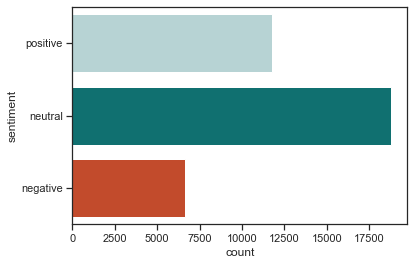

In [93]:
sns.countplot(y='sentiment', 
             data=comedyfinal, 
             palette=['#b2d8d9',"#008080", '#db3d13']
             );

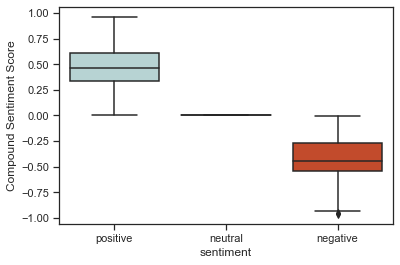

In [94]:
# Boxplot
sns.boxplot(y='Compound Sentiment Score', 
            x='sentiment',
            data=comedyfinal,
            palette=['#b2d8d8',"#008080", '#db3d13']
            );

# HISTORY

In [95]:
sentiment_of_text = get_sentiment_scores(historyfinal,'token')

display(sentiment_of_text.sample(5))

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score
10255,wherefore a guard of chosen shot i had,wherefore guard chosen shot,0.0,0.000,1.000,0.0000
35378,"sir robert brakenbury, and sir william bra...",sir robert brakenbury sir william brandon,0.0,0.000,1.000,0.0000
15675,"enter york, and his army of irish, with drum a...",enter york army irish drum colours,0.0,0.000,1.000,0.0000
11636,to raise a mutiny betwixt yourselves.,raise mutiny betwixt,0.0,0.000,1.000,0.0000
27149,come i to speak in caesar's funeral.,come speak caesar funeral,0.0,0.455,0.545,-0.3612


In [96]:
historyfinal['sentiment'] = historyfinal['Compound Sentiment Score'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
historyfinal.sample(5)

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score,sentiment
15715,"but if thy arms be to no other end,",thy arms end,0.0,0.000,1.000,0.0000,neutral
20491,"must pity drop upon her. verily,",must pity drop upon verily,0.0,0.589,0.411,-0.5106,negative
5965,your majesty hath no just cause to hate me.,majesty hath cause hate,0.0,0.552,0.448,-0.5719,negative
3343,keep the wild flood confin'd! let order di...,keep wild flood confin let order die,0.0,0.394,0.606,-0.5994,negative
9738,his brandish'd sword did blind men with hi...,brandish sword blind men beams,0.0,0.403,0.597,-0.4019,negative


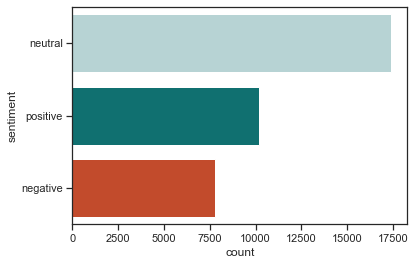

In [97]:
sns.countplot(y='sentiment', 
             data=historyfinal, 
             palette=['#b2d8d9',"#008080", '#db3d13']
             );

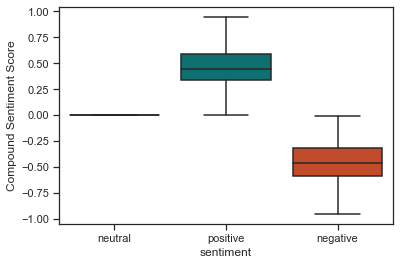

In [98]:
# Boxplot
sns.boxplot(y='Compound Sentiment Score', 
            x='sentiment',
            data=historyfinal,
            palette=['#b2d8d8',"#008080", '#db3d13']
            );

# TRAGEDY

In [99]:
sentiment_of_text = get_sentiment_scores(tragedyfinal,'token')

display(sentiment_of_text.sample(5))

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score
2313,enter a servant,enter servant,0.000,0.000,1.000,0.0000
4849,"menenius. take my cap, jupiter, and i thank ...",menenius take cap jupiter thank thee hoo,0.294,0.000,0.706,0.3612
16131,lag of a brother? why bastard? wherefore ...,lag brother bastard wherefore base,0.000,0.663,0.337,-0.7096
14897,and to such wondrous doing brought his horse,wondrous brought horse,0.000,0.000,1.000,0.0000
35957,"marry, for justice, she is so employ'd,",marry justice employ,0.630,0.000,0.370,0.5267


In [100]:
tragedyfinal['sentiment'] = tragedyfinal['Compound Sentiment Score'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
tragedyfinal.sample(5)

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score,sentiment
25084,"for thy escape would teach me tyranny,",thy escape would teach tyranny,0.298,0.000,0.702,0.1779,positive
32909,"most smiling, smooth, detested parasites,",smiling smooth detested parasites,0.500,0.000,0.500,0.4588,positive
21482,"let's make us medicines of our great revenge,",let make medicines great revenge,0.390,0.324,0.286,0.1779,positive
11398,a banish'd traitor.,banish traitor,0.000,0.744,0.256,-0.4404,negative
31966,"servant. here, my lord, in readiness.",servant lord readiness,0.500,0.000,0.500,0.2500,positive


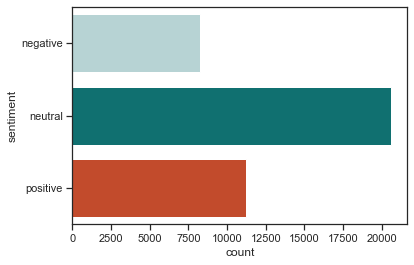

In [101]:
sns.countplot(y='sentiment', 
             data=tragedyfinal, 
             palette=['#b2d8d9',"#008080", '#db3d13']
             );

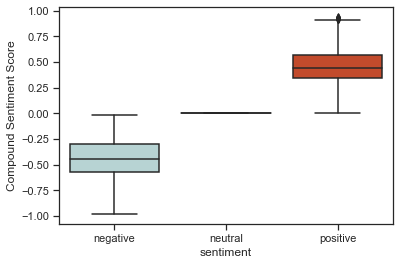

In [102]:
# Boxplot
sns.boxplot(y='Compound Sentiment Score', 
            x='sentiment',
            data=tragedyfinal,
            palette=['#b2d8d8',"#008080", '#db3d13']
            );

# POEM/SONNETS

In [103]:
sentiment_of_text = get_sentiment_scores(poemfinal,'token')

display(sentiment_of_text.sample(5))

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score
1512,and to be praised of ages yet to be.,praised ages yet,0.615,0.0,0.385,0.4939
1412,doth spot the beauty of thy budding name!,doth spot beauty thy budding name,0.432,0.0,0.568,0.5859
982,and strength by limping sway disabled,strength limping sway disabled,0.516,0.0,0.484,0.4939
2,"but as the riper should by time decease,",riper time decease,0.000,0.0,1.000,0.0000
343,to hear with eyes belongs to love's fine wit.,hear eyes belongs love fine wit,0.600,0.0,0.400,0.7184


In [104]:
poemfinal['sentiment'] = poemfinal['Compound Sentiment Score'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
poemfinal.sample(5)

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score,sentiment
2232,"those that can see thou lov'st, and i am b...",see thou lov blind,0.000,0.474,0.526,-0.4019,negative
1661,"no bitterness that i will bitter think,",bitterness bitter think,0.000,0.846,0.154,-0.6705,negative
1916,"since saucy jacks so happy are in this,",since saucy jacks happy,0.552,0.000,0.448,0.5719,positive
905,"so far from home into my deeds to pry,",far home deeds pry,0.000,0.000,1.000,0.0000,neutral
1886,"her audit (though delayed) answered must be,",audit though delayed answered must,0.000,0.322,0.678,-0.2263,negative


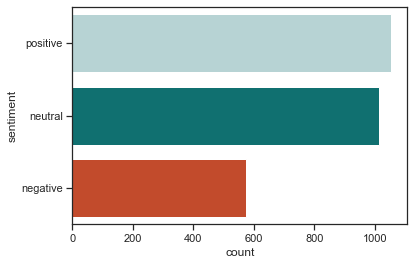

In [105]:
sns.countplot(y='sentiment', 
             data=poemfinal, 
             palette=['#b2d8d9',"#008080", '#db3d13']
             );

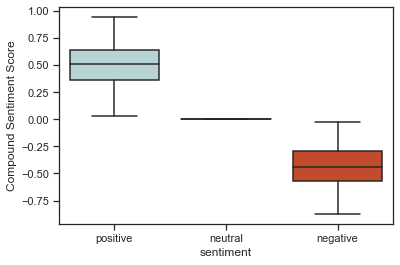

In [106]:
# Boxplot
sns.boxplot(y='Compound Sentiment Score', 
            x='sentiment',
            data=poemfinal,
            palette=['#b2d8d8',"#008080", '#db3d13']
            );

# Timeseries Analysis with respect to sentiments

4) Do a time series analysis for each genre (i.e. one for drama, one for comedy, etc.) of the 6 main sentiments. Smooth out the time series with a method of your choice, to get rid of noise. What can you conclude about sentiment in Shakespeare's works? What's your favorite work, and why?

From the below graphs my favorite shakespeare works are his poems due to the amount of happiness it generates

# History

Using text2emotion library to display the 5 types of emotions in a dictionary

In [107]:
import text2emotion as te
sentimenthist=te.get_emotion(historycombinewords)
print("Sentiments of history words :",sentimenthist)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/shankarasubramaniyang/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/shankarasubramaniyang/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/shankarasubramaniyang/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Sentiments of history words : {'Happy': 0.13, 'Angry': 0.08, 'Surprise': 0.2, 'Sad': 0.27, 'Fear': 0.32}


Plotting the above values using matplotlib library, we could see that fear was more and angry was 
less in the genre history

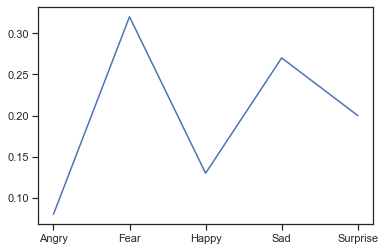

In [108]:
import matplotlib.pylab as plt

plt.plot(*zip(*sorted(sentimenthist.items())))
plt.show()

This is the timeseries analysis for each line from the dataframes which was created under previous sentiment analysis data

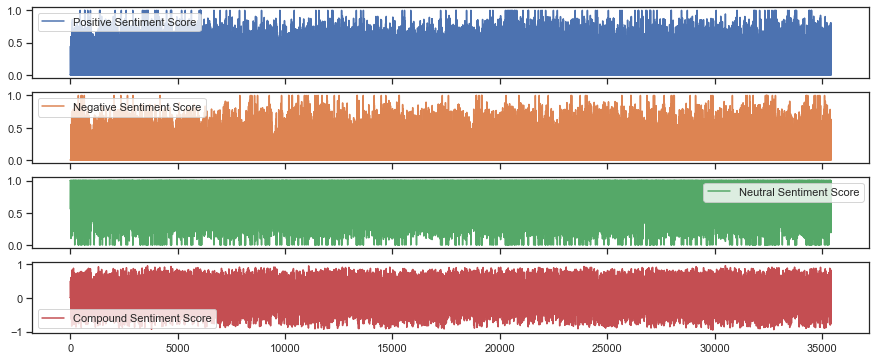

In [109]:
hf = historyfinal.loc[:,["Positive Sentiment Score","Negative Sentiment Score","Neutral Sentiment Score","Compound Sentiment Score"]]
hf.plot(subplots = True, figsize=(15,6))
plt.show()

# Comedy

Using text2emotion library to display the 5 types of emotions in a dictionary

In [110]:
sentimentcomedy=te.get_emotion(comedycombinewords)
print("Sentiments of comedy words :",sentimentcomedy)

Sentiments of comedy words : {'Happy': 0.15, 'Angry': 0.08, 'Surprise': 0.2, 'Sad': 0.25, 'Fear': 0.31}


Plotting the above values using matplotlib library, we could see that fear was high and angry was 
less in the genre comedy

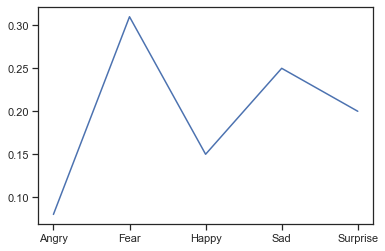

In [111]:
import matplotlib.pylab as plt

plt.plot(*zip(*sorted(sentimentcomedy.items())))
plt.show()

This is the timeseries analysis for each line from the dataframes which was created under previous sentiment analysis data

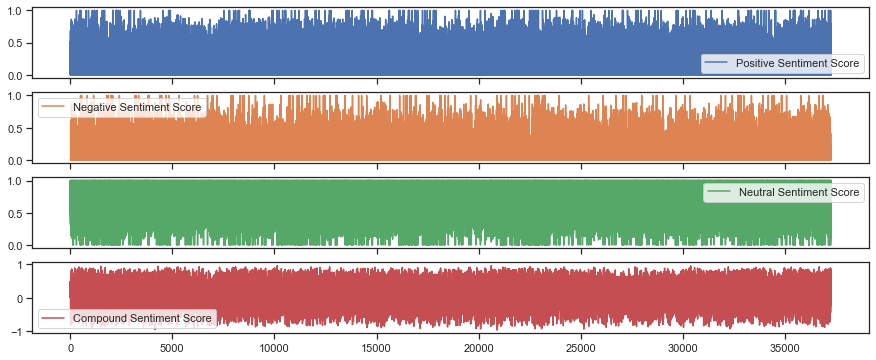

In [112]:
cf = comedyfinal.loc[:,["Positive Sentiment Score","Negative Sentiment Score","Neutral Sentiment Score","Compound Sentiment Score"]]
cf.plot(subplots = True, figsize=(15,6))
plt.show()

# Poem

Using text2emotion library to display the 5 types of emotions in a dictionary

In [113]:
sentimentpoem=te.get_emotion(poemcombinewords)
print("Sentiments of poem words :",sentimentpoem)

Sentiments of poem words : {'Happy': 0.19, 'Angry': 0.08, 'Surprise': 0.17, 'Sad': 0.29, 'Fear': 0.27}


Plotting the above values using matplotlib library, we could see that sadness was high and angry was
less in the genre poem

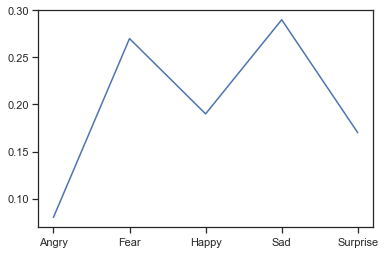

In [114]:
import matplotlib.pylab as plt

plt.plot(*zip(*sorted(sentimentpoem.items())))
plt.show()

This is the timeseries analysis for each line from the dataframes which was created under previous sentiment analysis data

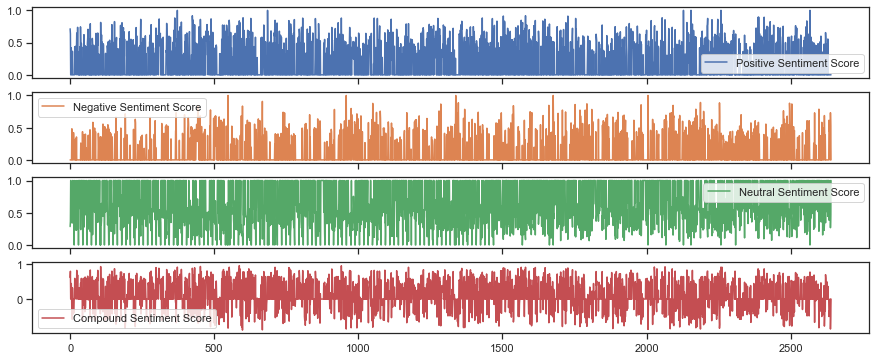

In [115]:
pf = poemfinal.loc[:,["Positive Sentiment Score","Negative Sentiment Score","Neutral Sentiment Score","Compound Sentiment Score"]]
pf.plot(subplots = True, figsize=(15,6))
plt.show()

# Tragedy

Using text2emotion library to display the 5 types of emotions in a dictionary

In [116]:
sentimenttragedy=te.get_emotion(tragedycombinewords)
print("Sentiments of tragedy words :",sentimenttragedy)    

Sentiments of tragedy words : {'Happy': 0.13, 'Angry': 0.08, 'Surprise': 0.21, 'Sad': 0.27, 'Fear': 0.32}


Plotting the above values using matplotlib library, we could see that fear was high and angry 
was less in the genre tragedy

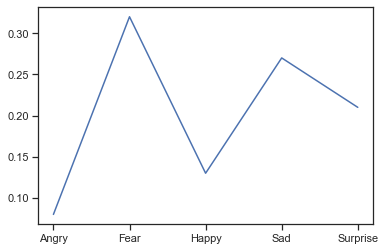

In [117]:
import matplotlib.pylab as plt

plt.plot(*zip(*sorted(sentimenttragedy.items())))
plt.show()

This is the timeseries analysis for each line from the dataframes which was created under previous sentiment analysis data

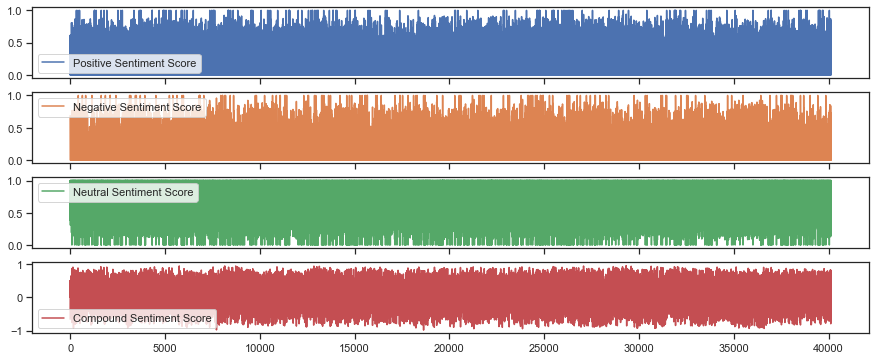

In [118]:
tf = tragedyfinal.loc[:,["Positive Sentiment Score","Negative Sentiment Score","Neutral Sentiment Score","Compound Sentiment Score"]]
tf.plot(subplots = True, figsize=(15,6))
plt.show()

# Probability distribution function

Part 2)
What's the probability that Shakespeare asks a question?
What's the distribution of the number of questions for all his works? What's the distribution of the number of questions based on genre (comedies, tragedies, histories, sonnets)? Note that sonnets (poems) don't have many questions, so you may not find any in that genre.
What well known probability distributions could you match each one with? If not possible, how could you simplify the problem (maybe get rid of some outliers?) to answer this question? 

Probability that Shakespeare asks a question= Number of lines with questions/total number of lines

In [119]:
question=input_data[input_data['text'].str.contains('?', regex=False)]
question=question.reset_index(drop=True)
question

,text,token
0,disdains the tillage of thy husbandry?,"[disdains, the, tillage, of, thy, husbandry]"
1,of his self-love to stop posterity?,"[of, his, self, love, to, stop, posterity]"
2,upon thy self thy beauty's legacy?,"[upon, thy, self, thy, beauty, s, legacy]"
3,the bounteous largess given thee to give?,"[the, bounteous, largess, given, thee, to, give]"
4,so great a sum of sums yet canst not live?,"[so, great, a, sum, of, sums, yet, canst, not,..."
...,...,...
9701,"'""the diamond? why, 'twas beautiful and hard,","[the, diamond, why, twas, beautiful, and, hard]"
9702,"of stale example? when thou wilt inflame,","[of, stale, example, when, thou, wilt, inflame]"
9703,what rocky heart to water will not wear?,"[what, rocky, heart, to, water, will, not, wear]"
9704,what breast so cold that is not warmed here?,"[what, breast, so, cold, that, is, not, warmed..."


In [120]:
total_line_count=len(input_data.index)
print("Total number of lines in the text:", total_line_count)

question_line_count= len(question.index)
print("Total number of line with the question :", question_line_count)

prob=question_line_count/total_line_count
print("Total prob :", round(prob,2))

Total number of lines in the text: 112903
Total number of line with the question : 9706
Total prob : 0.09


# Comedies

Calculating the probability of questions asked under comedy genre

In [121]:
comedyquestion=comedyfinal[comedyfinal['text'].str.contains('?', regex=False)]
comedyquestion=comedyquestion.reset_index(drop=True)
comedyquestion

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score,sentiment
0,countess. what hope is there of his majesty'...,countess hope majesty amendment,0.492,0.0,0.508,0.4404,positive
1,"lafeu. how call'd you the man you speak of, ...",lafeu call man speak madam,0.000,0.0,1.000,0.0000,neutral
2,"bertram. what is it, my good lord, the king ...",bertram good lord king languishes,0.420,0.0,0.580,0.4404,positive
3,daughter of gerard de narbon?,daughter gerard narbon,0.000,0.0,1.000,0.0000,neutral
4,lafeu. how understand we that?,lafeu understand,0.000,0.0,1.000,0.0000,neutral
...,...,...,...,...,...,...,...
3518,"proteus. where is that ring, boy?",proteus ring boy,0.000,0.0,1.000,0.0000,neutral
3519,proteus. but how cam'st thou by this ring?,proteus cam thou ring,0.000,0.0,1.000,0.0000,neutral
3520,more fresh in julia's with a constant eye?,fresh julia constant eye,0.434,0.0,0.566,0.3182,positive
3521,"what think you of this page, my lord?",think page lord,0.000,0.0,1.000,0.0000,neutral


In [122]:
comedy_line_count=len(comedyfinal.index)
print("Total number of lines in the comedytext:", comedy_line_count)

comedyquestion_line_count= len(comedyquestion.index)
print("Total number of line with the question in comedy :", comedyquestion_line_count)

prob=comedyquestion_line_count/comedy_line_count
print("Total prob of comedy genre :", round(prob,2))

Total number of lines in the comedytext: 37248
Total number of line with the question in comedy : 3523
Total prob of comedy genre : 0.09


Bernoulli Distribution

Plotting the above probability in Bernoulli distribution

[Text(0.5, 0, 'Bernoulli Distribution in comedy'), Text(0, 0.5, 'Frequency')]

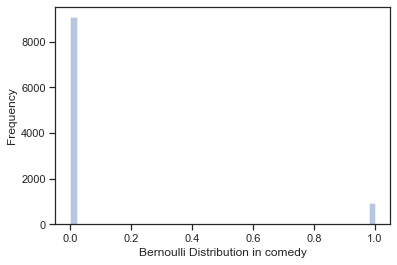

In [124]:
import scipy.stats as stats
# size = number of experiments
# p = probability of success
bern_comedy = stats.bernoulli.rvs(size=10000, p=0.09)
ax_comedy= sns.distplot(bern_comedy,
                 kde=False)
ax_comedy.set(xlabel='Bernoulli Distribution in comedy', ylabel='Frequency')

Binomial Distribution:

Plotting the above probability in binomial distribution

<AxesSubplot:ylabel='Frequency'>

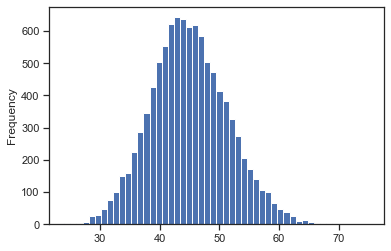

In [125]:
# size = number of experiments
# p = probability of success
import scipy.stats as stats
binomial_comedy_data = stats.binom.rvs(size=10000, n=500, p=0.09, random_state=0)
pd.Series(binomial_comedy_data).plot(kind="hist", bins = 50)

# Tragedies

In [126]:
tragedyquestion=tragedyfinal[tragedyfinal['text'].str.contains('?', regex=False)]
tragedyquestion=tragedyquestion.reset_index(drop=True)
tragedyquestion

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score,sentiment
0,"antony. how, my love?",antony love,0.808,0.00,0.192,0.6369,positive
1,"cleopatra. perchance? nay, and most like,",cleopatra perchance nay like,0.455,0.00,0.545,0.3612,positive
2,where's fulvia's process? caesar's i would...,fulvia process caesar would say,0.000,0.00,1.000,0.0000,neutral
3,"why did he marry fulvia, and not love her?",marry fulvia love,0.677,0.00,0.323,0.6369,positive
4,without some pleasure now. what sport to-n...,without pleasure sport night,0.000,0.50,0.500,-0.4585,negative
...,...,...,...,...,...,...,...
3511,could ever yet cut breath? let no man mock...,could ever yet cut breath let man mock,0.000,0.45,0.550,-0.5994,negative
3512,with oily painting. shall i draw the curtain?,oily painting shall draw curtain,0.000,0.00,1.000,0.0000,neutral
3513,is she become the suitor?,become suitor,0.000,0.00,1.000,0.0000,neutral
3514,where hast thou been preserv'd? where liv'...,hast thou preserv liv found,0.000,0.00,1.000,0.0000,neutral


In [127]:
tragedy_line_count=len(tragedyfinal.index)
print("Total number of lines in the tragedytext:", tragedy_line_count)

tragedyquestion_line_count= len(tragedyquestion.index)
print("Total number of line with the question in tragedy :", tragedyquestion_line_count)

prob=tragedyquestion_line_count/tragedy_line_count
print("Total prob of tragedy genre :", round(prob,2))

Total number of lines in the tragedytext: 40134
Total number of line with the question in tragedy : 3516
Total prob of tragedy genre : 0.09


Bernoulli distribution

[Text(0.5, 0, 'Bernoulli Distribution in tragedy'), Text(0, 0.5, 'Frequency')]

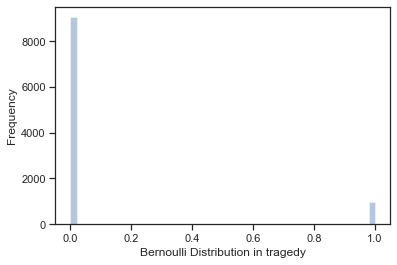

In [128]:
# size = number of experiments
# p = probability of success
bern_tragedy = stats.bernoulli.rvs(size=10000, p=0.09)
ax_tragedy= sns.distplot(bern_tragedy,
                 kde=False)
ax_tragedy.set(xlabel='Bernoulli Distribution in tragedy', ylabel='Frequency')

Binomial distribution

<AxesSubplot:ylabel='Frequency'>

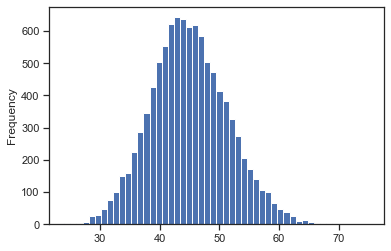

In [129]:
# size = number of experiments
# p = probability of success
import scipy.stats as stats
binomial_tragedy_data = stats.binom.rvs(size=10000, n=500, p=0.09, random_state=0)
pd.Series(binomial_tragedy_data).plot(kind="hist", bins = 50)

# Histories

In [130]:
historyquestion=historyfinal[historyfinal['text'].str.contains('?', regex=False)]
historyquestion=historyquestion.reset_index(drop=True)
historyquestion

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score,sentiment
0,and is not this an honourable spoil?,honourable spoil,0.756,0.000,0.244,0.4767,positive
1,"a gallant prize? ha, cousin, is it not?",gallant prize cousin,0.857,0.000,0.143,0.7184,positive
2,of this young percy's pride? the prisoners,young percy pride prisoners,0.312,0.429,0.260,-0.2263,negative
3,"fal. now, hal, what time of day is it, lad?",fal hal time day lad,0.000,0.000,1.000,0.0000,neutral
4,"prince. what, none?",prince none,0.000,0.000,1.000,0.0000,neutral
...,...,...,...,...,...,...,...
2795,shall these enjoy our lands? lie with our ...,shall enjoy lands lie wives,0.444,0.000,0.556,0.4939,positive
2796,ravish our daughters? [drum afar off] ha...,ravish daughters drum afar hark hear,0.000,0.000,1.000,0.0000,neutral
2797,what says lord stanley? will he bring his ...,says lord stanley bring power,0.000,0.000,1.000,0.0000,neutral
2798,richmond. what men of name are slain on eith...,richmond men name slain either side,0.000,0.000,1.000,0.0000,neutral


In [131]:
history_line_count=len(historyfinal.index)
print("Total number of lines in the historytext:", history_line_count)

historyquestion_line_count= len(historyquestion.index)
print("Total number of line with the question in history :", historyquestion_line_count)

prob=historyquestion_line_count/history_line_count
print("Total prob of history genre :", round(prob,2))

Total number of lines in the historytext: 35407
Total number of line with the question in history : 2800
Total prob of history genre : 0.08


Bernoulli Distribution

[Text(0.5, 0, 'Bernoulli Distribution in history'), Text(0, 0.5, 'Frequency')]

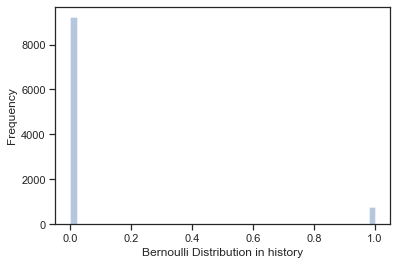

In [143]:
bern_history = stats.bernoulli.rvs(size=10000, p=0.08)
ax_history= sns.distplot(bern_history,
                 kde=False)
ax_history.set(xlabel='Bernoulli Distribution in history', ylabel='Frequency')

Binomial distribution

<AxesSubplot:ylabel='Frequency'>

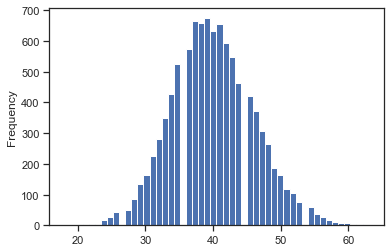

In [142]:
binomial_history_data = stats.binom.rvs(size=10000, n=500, p=0.08, random_state=0)
pd.Series(binomial_history_data).plot(kind="hist", bins = 50)

# Poem

In [135]:
poemquestion=poemfinal[poemfinal['text'].str.contains('?', regex=False)]
poemquestion=poemquestion.reset_index(drop=True)
poemquestion

,text,token,Positive Sentiment Score,Negative Sentiment Score,Neutral Sentiment Score,Compound Sentiment Score,sentiment
0,disdains the tillage of thy husbandry?,disdains tillage thy husbandry,0.000,0.000,1.000,0.0000,neutral
1,of his self-love to stop posterity?,self love stop posterity,0.500,0.262,0.238,0.4588,positive
2,upon thy self thy beauty's legacy?,upon thy self thy beauty legacy,0.432,0.000,0.568,0.5859,positive
3,the bounteous largess given thee to give?,bounteous largess given thee give,0.000,0.000,1.000,0.0000,neutral
4,so great a sum of sums yet canst not live?,great sum sums yet canst live,0.451,0.000,0.549,0.6249,positive
...,...,...,...,...,...,...,...
93,"'""the diamond? why, 'twas beautiful and hard,",diamond twas beautiful hard,0.724,0.161,0.115,0.7096,positive
94,"of stale example? when thou wilt inflame,",stale example thou wilt inflame,0.000,0.000,1.000,0.0000,neutral
95,what rocky heart to water will not wear?,rocky heart water wear,0.000,0.000,1.000,0.0000,neutral
96,what breast so cold that is not warmed here?,breast cold warmed,0.512,0.000,0.488,0.2732,positive


In [136]:
poem_line_count=len(poemfinal.index)
print("Total number of lines in the poemtext:", poem_line_count)

poemquestion_line_count= len(poemquestion.index)
print("Total number of line with the question in poem :", poemquestion_line_count)

prob=poemquestion_line_count/poem_line_count
print("Total prob of poem genre :", round(prob,2))

Total number of lines in the poemtext: 2641
Total number of line with the question in poem : 98
Total prob of poem genre : 0.04


Bernoulli distribution

[Text(0.5, 0, 'Bernoulli Distribution in poem'), Text(0, 0.5, 'Frequency')]

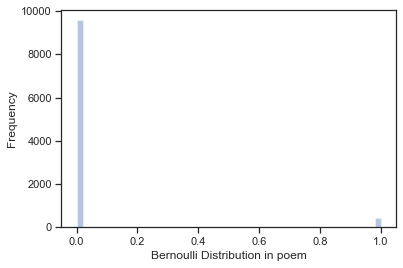

In [144]:
bern_poem = stats.bernoulli.rvs(size=10000, p=0.04)
ax_poem= sns.distplot(bern_poem,
                 kde=False)
ax_poem.set(xlabel='Bernoulli Distribution in poem', ylabel='Frequency')

Binomial distribution

<AxesSubplot:ylabel='Frequency'>

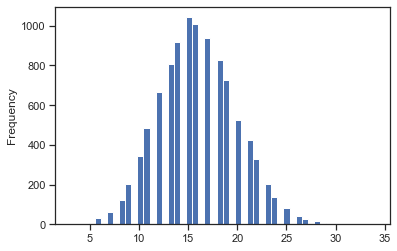

In [145]:
binomial_poem_data = stats.binom.rvs(size=10000, n=400, p=0.04, random_state=0)
pd.Series(binomial_poem_data).plot(kind="hist", bins = 50)